# **Spelling Mistake Identification in Handwritten TextSubmission**


---



Pipeline:


1.   Load Dependencies
2.   Read Image
3.   Text Extraction Using Azure OCR Service
4.   Misspelled word check using pyspellchecker








In [ ]:
import os
import pandas as pd
from azure.ai.vision.imageanalysis import ImageAnalysisClient
from azure.ai.vision.imageanalysis.models import VisualFeatures
from azure.core.credentials import AzureKeyCredential

# Initialising Azure OCR credentials

In [ ]:
endpoint = "https://azure-cv-akash.cognitiveservices.azure.com/"
key = "c84f2be05d744a2eaff3f060bc840a3f"

In [ ]:
# Create an Image Analysis client
client = ImageAnalysisClient(
    endpoint=endpoint,
    credential=AzureKeyCredential(key)
)

# Image Path

In [ ]:
Image_path=r"/content/Sample_Images/sample 13.jpg"

# Inference

In [ ]:
def Extract_text(image_path):
  with open(image_path, "rb") as f:
    image_data = f.read()
  result = client.analyze(
    image_data=image_data,
    visual_features=[VisualFeatures.READ])

  return result

In [ ]:
def print_result(result):
  print("Image analysis results:")
  # Print caption results to the console
  print(" Caption:")
  if result.caption is not None:
      print(f"   '{result.caption.text}', Confidence {result.caption.confidence:.4f}")

  # Print text (OCR) analysis results to the console
  print(" Read:")
  if result.read is not None:
      for line in result.read.blocks[0].lines:
          print(f"   Line: '{line.text}', Bounding box {line.bounding_polygon}")
          for word in line.words:
              print(f"     Word: '{word.text}', Bounding polygon {word.bounding_polygon}, Confidence {word.confidence:.4f}")

In [ ]:
def convert_to_DataFrame(res):
  data = []
  lines=[]
  # res=result['readResult']
  # Process each block, line, and word in the OCR data
  for block in res['blocks']:
      for line in block['lines']:
          for word in line['words']:
              # Flatten the bounding polygon for easier display/storage
              flat_polygon = [coord for pt in word['boundingPolygon'] for coord in (pt['x'], pt['y'])]
              # Append the details of each word to the list
              data.append({
                  "Word": word['text'],
                  "Bounding Polygon": flat_polygon,
                  "Confidence": word['confidence']})
              lines.append({"Line Text": line['text']})
  return pd.DataFrame(data),pd.DataFrame(lines)

# Create a DataFrame from the list
# df = pd.DataFrame(data)

In [ ]:
result=Extract_text(Image_path)

In [ ]:
# print_result(result)

In [ ]:
df,lines=convert_to_DataFrame(result['readResult'])
df

,Word,Bounding Polygon,Confidence
0,Date.,"[1295, 628, 1392, 628, 1392, 668, 1295, 669]",0.980
1,|,"[1400, 629, 1413, 629, 1413, 667, 1400, 668]",0.721
2,(Page.,"[1283, 685, 1391, 687, 1389, 728, 1283, 725]",0.575
3,|,"[1399, 687, 1420, 688, 1418, 730, 1397, 729]",0.593
4,30,"[1458, 682, 1530, 686, 1528, 738, 1455, 735]",0.995
...,...,...,...
103,three,"[583, 2874, 792, 2879, 790, 2954, 581, 2948]",0.982
104,questions,"[848, 2881, 1242, 2885, 1240, 2963, 846, 2956]",0.950
105,as,"[1269, 2886, 1360, 2886, 1358, 2963, 1267, 2963]",0.987
106,the,"[1426, 2886, 1556, 2886, 1554, 2963, 1424, 2963]",0.993


In [ ]:
df['Confidence'].mean()

0.8811203703703703

# Image Inference

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

In [ ]:
# Define color and thickness
color = (255, 0, 0)  # Blue
thickness = 5
font_scale = 2
font = cv2.FONT_HERSHEY_SIMPLEX

In [ ]:
def Image_inference(Image_path,result):
  image = cv2.imread(Image_path)
  for block in result['readResult']['blocks']:
      for line in block['lines']:
          # # Draw line bounding box
          # line_pts = np.array([[pt['x'], pt['y']] for pt in line['boundingPolygon']], np.int32)
          # line_pts = line_pts.reshape((-1, 1, 2))
          # cv2.polylines(image, [line_pts], isClosed=True, color=color, thickness=thickness)

          for word in line['words']:
              # Draw word bounding box
              word_pts = np.array([[pt['x'], pt['y']] for pt in word['boundingPolygon']], np.int32)
              word_pts = word_pts.reshape((-1, 1, 2))
              cv2.polylines(image, [word_pts], isClosed=True, color=(255, 0, 0), thickness=8)  # Green for words

              # Put text annotation
              cv2.putText(image, word['text'], (word['boundingPolygon'][0]['x'], word['boundingPolygon'][0]['y'] - 10),
                          font, fontScale=font_scale, color=(0,0 , 255), thickness=4)

  img=cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
  return img


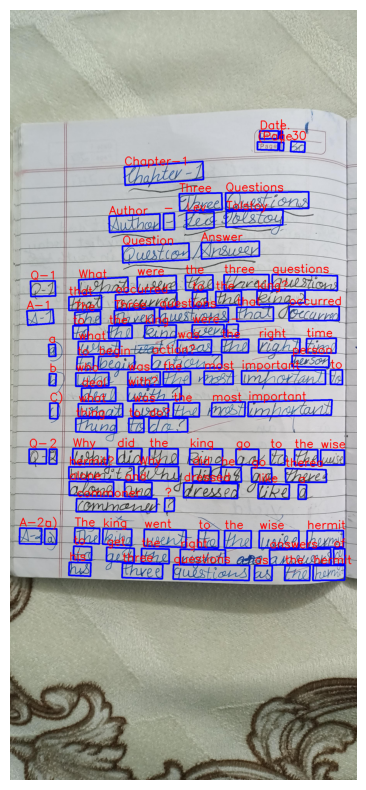

In [ ]:

img=Image_inference(Image_path,result)
plt.figure(figsize=(10, 10))
plt.imshow(img)  # Convert BGR to RGB for Matplotlib
plt.axis('off')  # Hide axes
plt.show()


### Sample Spell Check

In [ ]:
from spellchecker import SpellChecker

spell = SpellChecker()

# List of words to check
words_to_check = ['something', 'is', 'hapenning', 'here','animall']

# Find those words that may be misspelled
misspelled = spell.unknown(words_to_check)

for word in words_to_check:
    # Get the most likely correction
    if word not in misspelled:
      print("Correct Word : ", word)
    else:
      correction = spell.correction(word)
      print(f"Original: {word}, Correction: {correction}")

      # Get a list of likely options
      candidates = spell.candidates(word)
      print(f"Candidates for '{word}': {candidates}")

Correct Word :  something
Correct Word :  is
Original: hapenning, Correction: happening
Candidates for 'hapenning': {'penning', 'happening', 'japanning'}
Correct Word :  here
Original: animall, Correction: animal
Candidates for 'animall': {'animal', 'animals'}


# **Misspelled check**

In [ ]:
import cv2
import numpy as np
import re

# Define visual properties for text and boxes
color_correct = (0, 255, 0)  # Green color for correct words
color_misspelled = (255,0,0)  # Red color for misspelled words
thickness = 2
font = cv2.FONT_HERSHEY_SIMPLEX
font_scale = 1.5


In [ ]:
 # Check if alphabetic (ignoring apostrophes)
def is_pure_alpha(word):
  return re.sub(r"[^\w\s']", '', word)


In [ ]:
def Check_Misspelled(Image_path,result):
  image = cv2.imread(Image_path)
# Initialize the spell checker
  Misspelled=[]
  spell = SpellChecker()

  # Load the image
  image = cv2.imread(Image_path)
  # result  from  OCR output
  for block in result['readResult']['blocks']:
      for line in block['lines']:
          line_pts = np.array([[pt['x'], pt['y']] for pt in line['boundingPolygon']], np.int32)
          line_pts = line_pts.reshape((-1, 1, 2))
          cv2.polylines(image, [line_pts], isClosed=True, color=color_correct, thickness=thickness)

          for word in line['words']:
              word_text = word['text']
              if is_pure_alpha(word_text):  # Check if the word is purely alphabetic
                  clean_word = word_text.lower()  # Use cleaned word for spell checking
                  word_pts = np.array([[pt['x'], pt['y']] for pt in word['boundingPolygon']], np.int32)
                  word_pts = word_pts.reshape((-1, 1, 2))

                  # Check if the word is misspelled
                  if (clean_word in spell.unknown([clean_word] )and clean_word.isalpha()):
                      Misspelled.append(clean_word)
                      cv2.polylines(image, [word_pts], isClosed=True, color=color_misspelled, thickness=thickness)
                      correction = spell.correction(clean_word)
                      text=clean_word+'('+correction+')'
                      cv2.putText(image, text, (word['boundingPolygon'][0]['x'], word['boundingPolygon'][0]['y'] - 10),
                                  font, fontScale=font_scale, color=color_misspelled, thickness=5)
                  else:
                      cv2.polylines(image, [word_pts], isClosed=True, color=color_correct, thickness=thickness)





  print("Number of Misspelled words :", len(Misspelled))
  print(Misspelled)
  return image


Number of Misspelled words : 2
['tolstoy', 'therea']


(-0.5, 1799.5, 3999.5, -0.5)

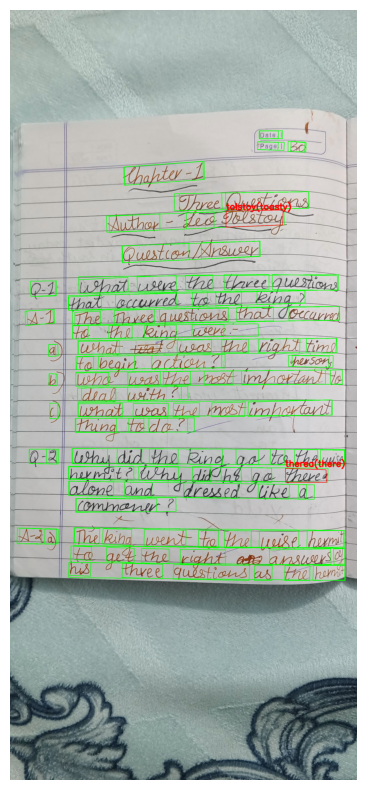

In [ ]:
image = Check_Misspelled(Image_path,result)
plt.figure(figsize=(10, 10))
plt.imshow(image)
plt.axis('off')

# Infer on Batch of Images

In [ ]:
import os
from PIL import Image
import cv2


In [ ]:
base_folder = '/content/Sample_Images'

inference_folder = os.path.join(base_folder, 'Inference')
text_extraction_folder = os.path.join(inference_folder, 'Text_extraction')
misspell_check_folder = os.path.join(inference_folder, 'Misspell_check')


In [ ]:
# Create directories if they do not exist
os.makedirs(text_extraction_folder, exist_ok=True)
os.makedirs(misspell_check_folder, exist_ok=True)

In [ ]:
def Text_extract(image_path, output_path,result):

    image = Image_inference(image_path,result)
    cv2.imwrite(output_path, image)

def Misspell_check(image_path, output_path,result):
    image = Check_Misspelled(image_path,result)
    cv2.imwrite(output_path, image)

In [ ]:
# Loop through all files in the base folder
for file in os.listdir(base_folder):
    if file.lower().endswith(('.png', '.jpg', '.jpeg')):  # Check for image files
        file_path = os.path.join(base_folder, file)
        print(file_path)

        result=Extract_text(file_path)
        # Output paths
        text_output_path = os.path.join(text_extraction_folder, file)
        misspell_output_path = os.path.join(misspell_check_folder, file)

        # Process images
        Text_extract(file_path, text_output_path,result)
        Misspell_check(file_path, misspell_output_path,result)

print("Processing complete.")


/content/Sample_Images/sample 8.jpeg
Number of Misspelled words : 9
['demeracies', 'wonderfull', 'stysteme', 'democraces', 'glovermed', 'havesh', 'hardely', 'frue', 'alt']
/content/Sample_Images/sample 10.jpg
Number of Misspelled words : 1
['iting']
/content/Sample_Images/sample 2.jpeg
Number of Misspelled words : 5
['paga', 'ed', 'ates', 'envolope', 'shaftin']
/content/Sample_Images/sample 7.jpg
Number of Misspelled words : 3
['anst', 'forrest', 'ar']
/content/Sample_Images/sample 1.jpeg
Number of Misspelled words : 4
['paga', 'decomposers', 'decomposers', 'exas']
/content/Sample_Images/sample 12.jpg
Number of Misspelled words : 1
['whon']
/content/Sample_Images/sample 9.jpg
Number of Misspelled words : 1
['isk']
/content/Sample_Images/sample 13.jpg
Number of Misspelled words : 2
['tolstoy', 'therea']
/content/Sample_Images/sample 6.jpeg
Number of Misspelled words : 4
['gagovernment', 'gove', 'chean', 'soit']
/content/Sample_Images/sample 11.jpg
Number of Misspelled words : 1
['tolsto

# Ploting Inferred Batch of Images


In [ ]:

from PIL import Image

def plot_images_from_folder(path):
  image_directory = path
  image_files = [f for f in os.listdir(image_directory) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

  for  img_file in (image_files):
      img_path = os.path.join(image_directory, img_file)
      img = Image.open(img_path)
      plt.figure(figsize=(10, 10))
      plt.imshow(img)
      plt.axis('off')
      plt.title(img_file)
  plt.show()


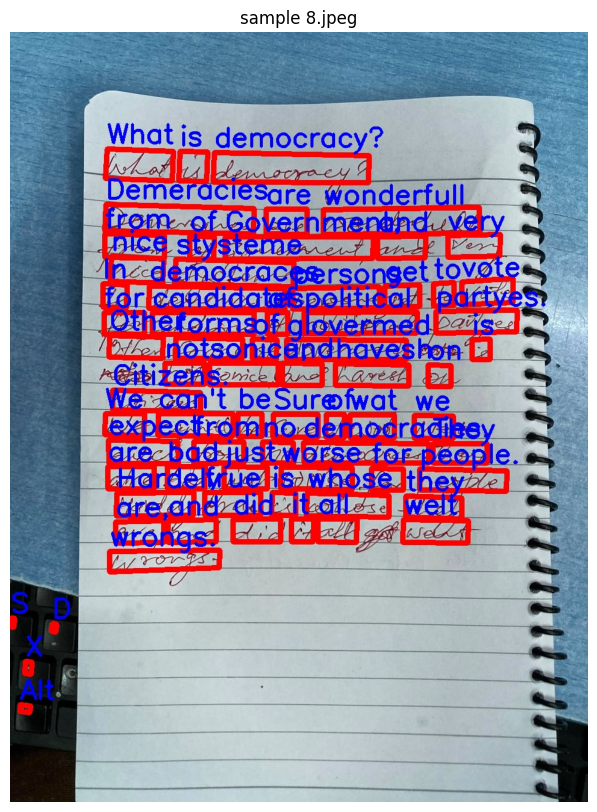

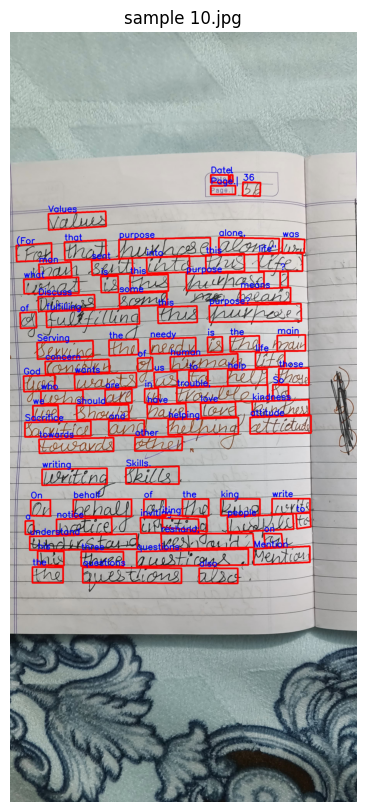

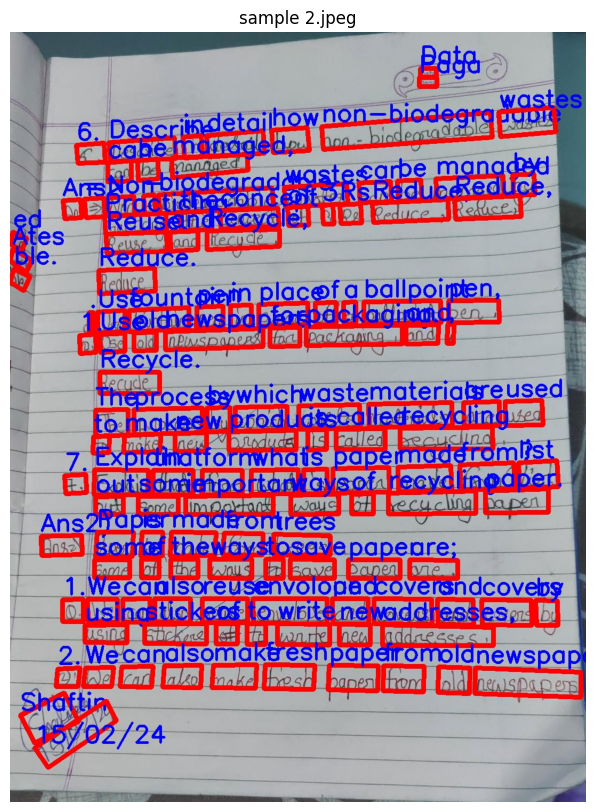

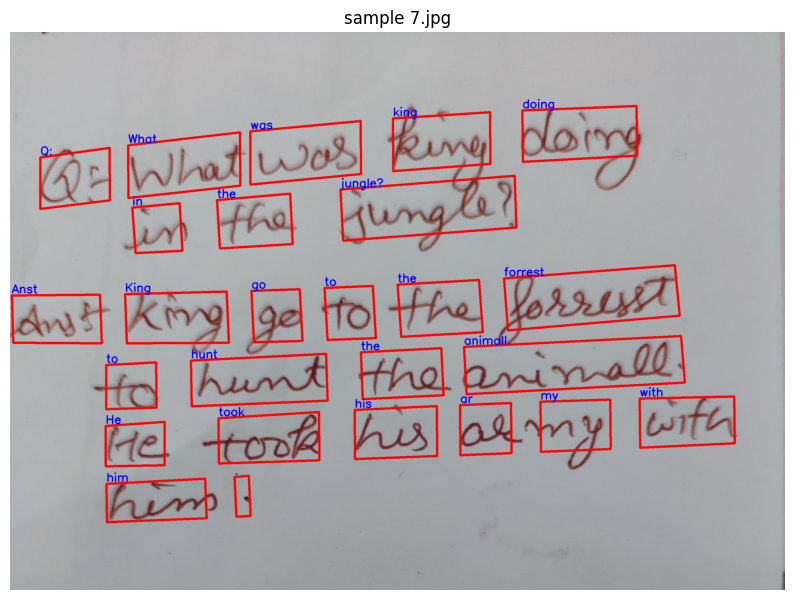

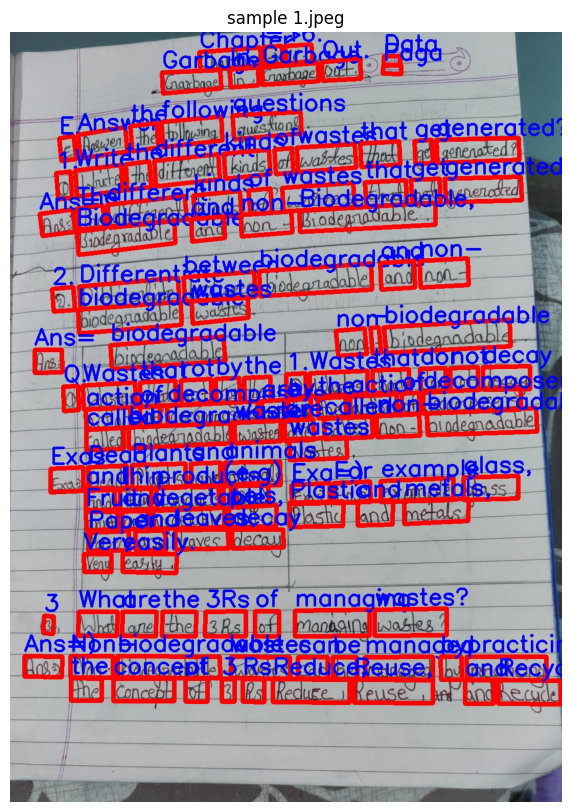

...

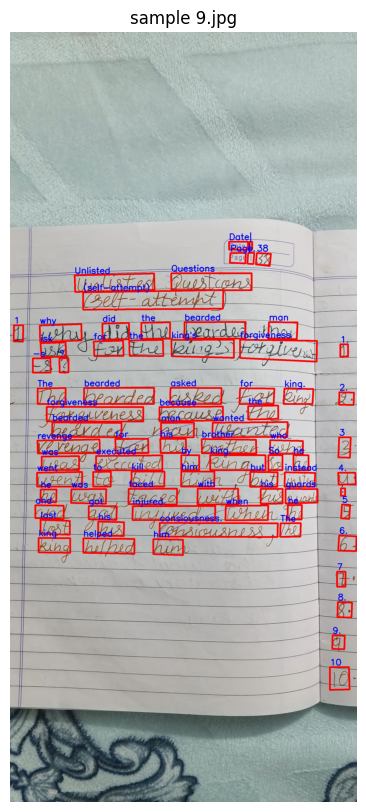

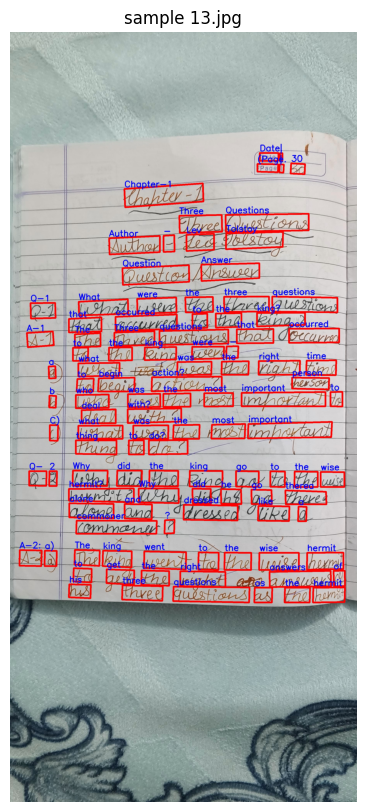

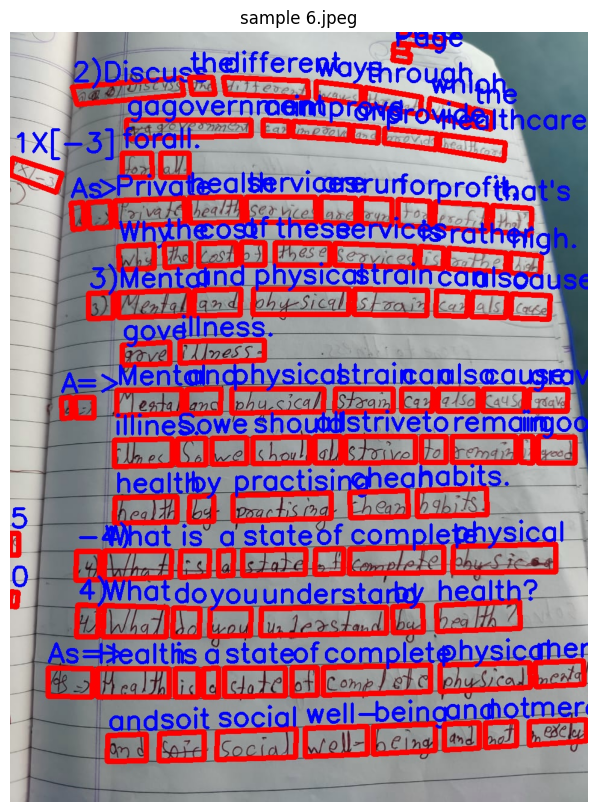

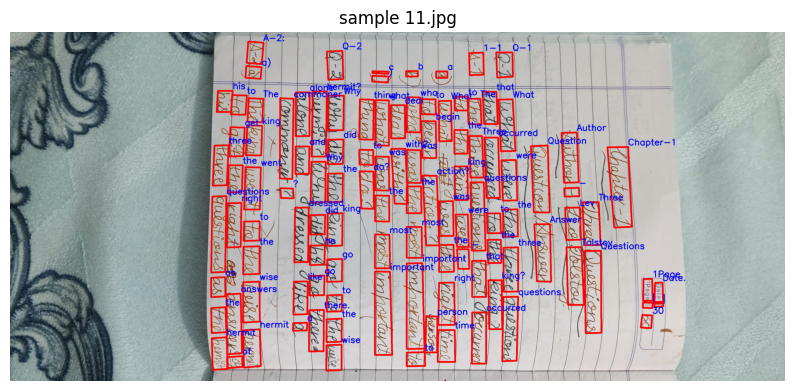

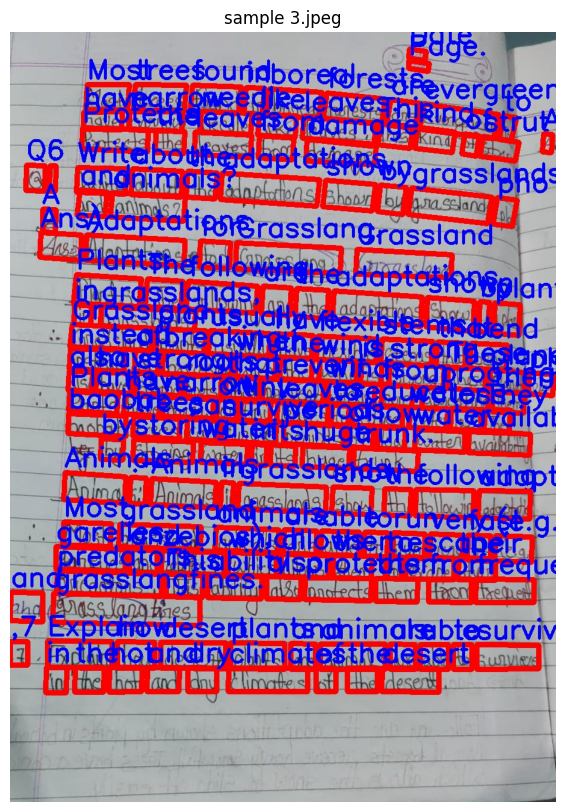

In [ ]:
plot_images_from_folder("/content/Sample_Images/Inference/Text_extraction")

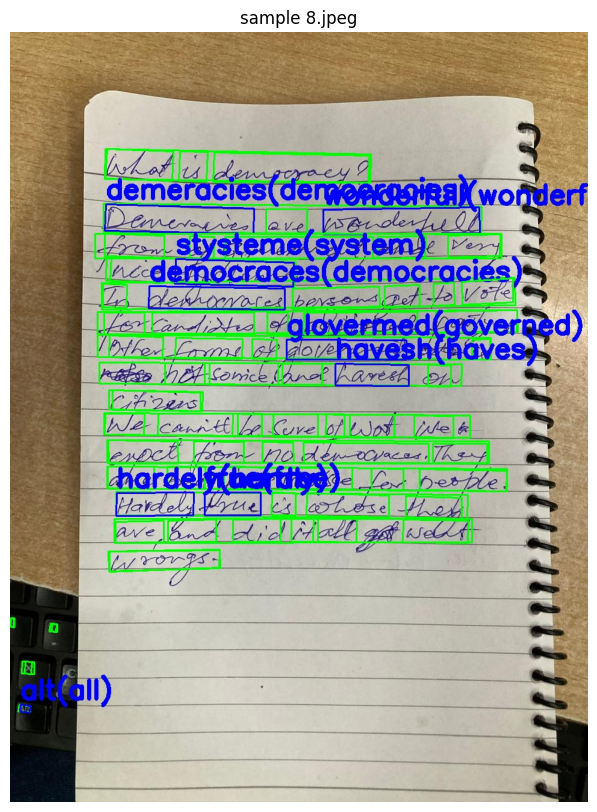

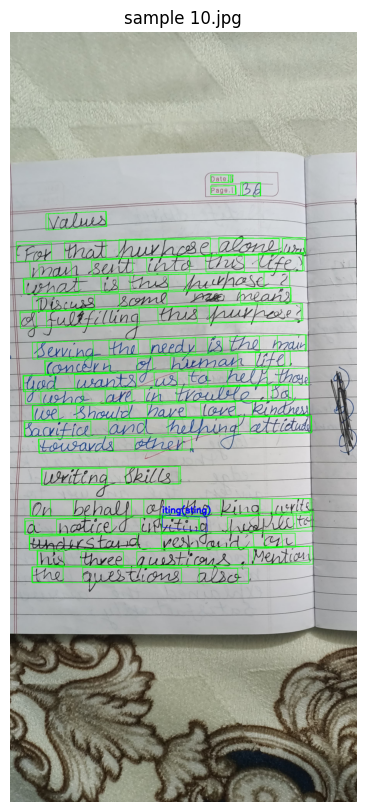

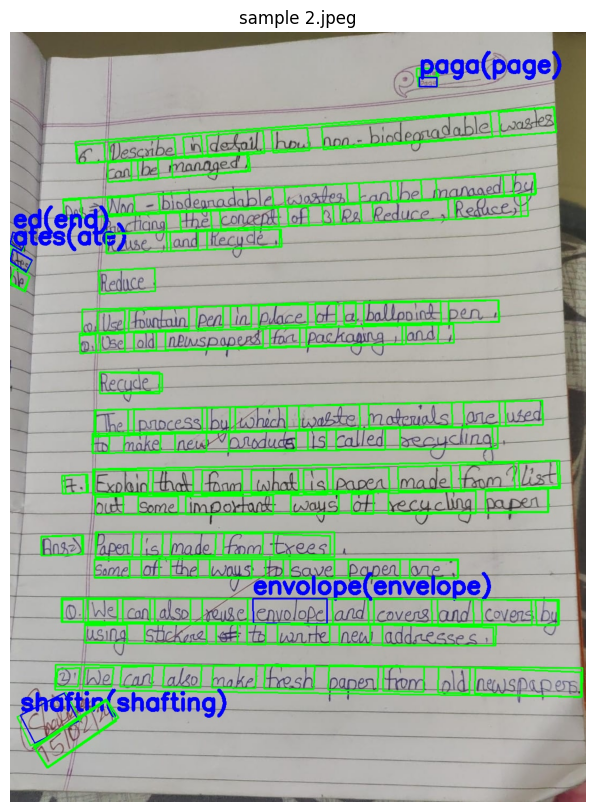

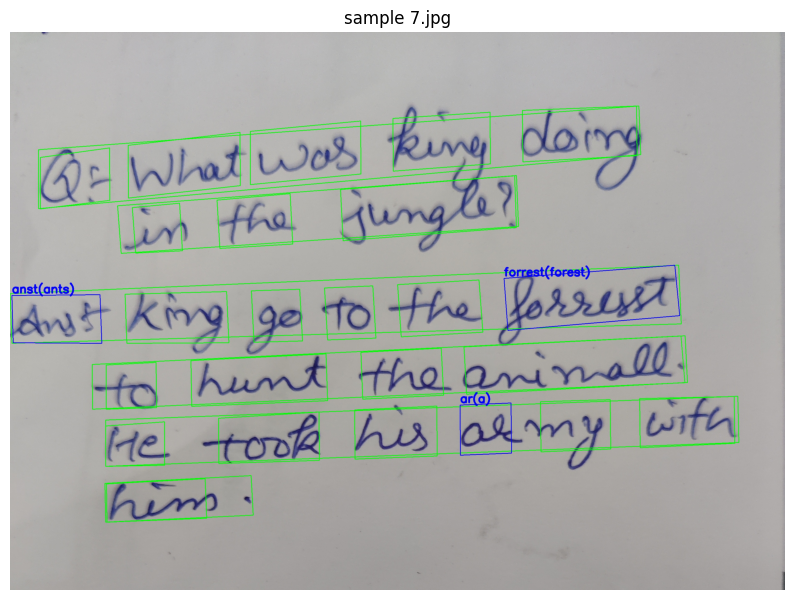

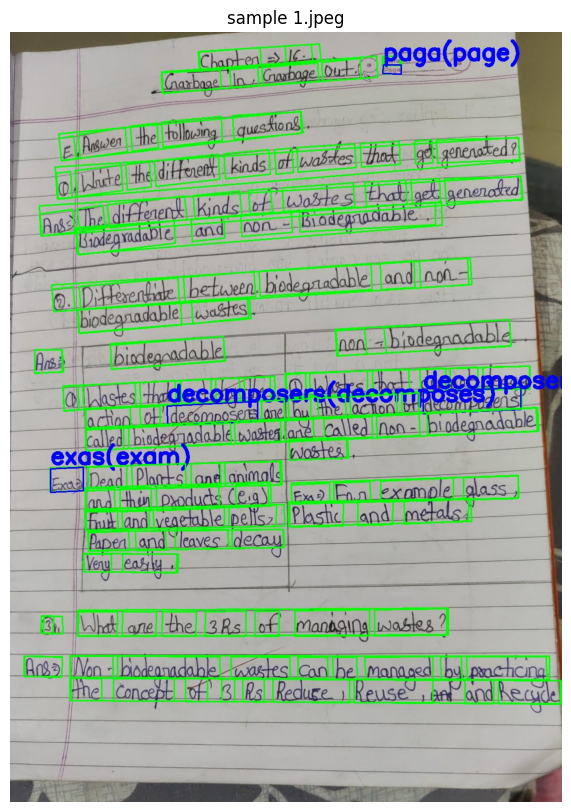

...

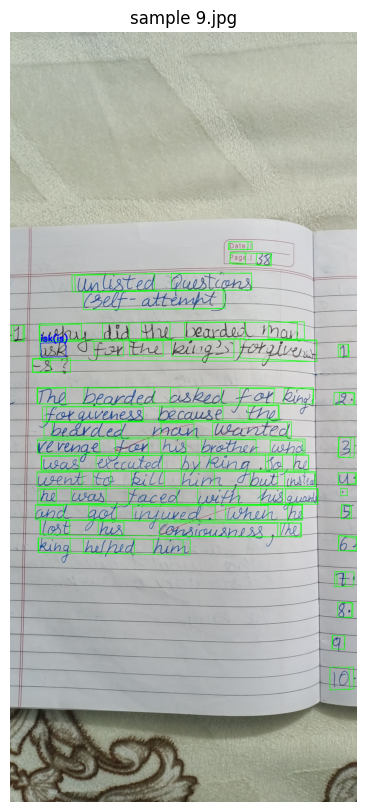

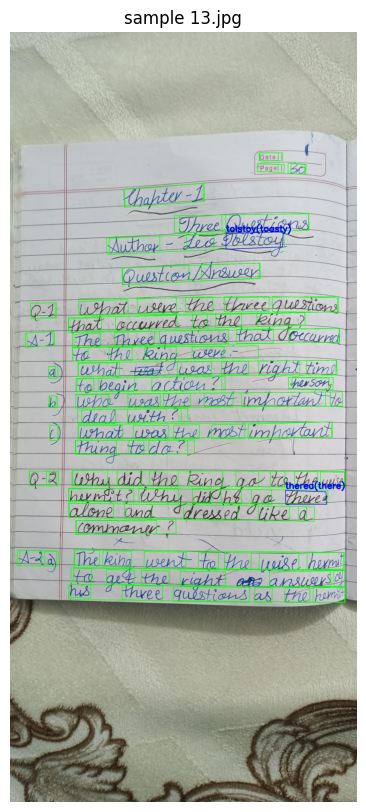

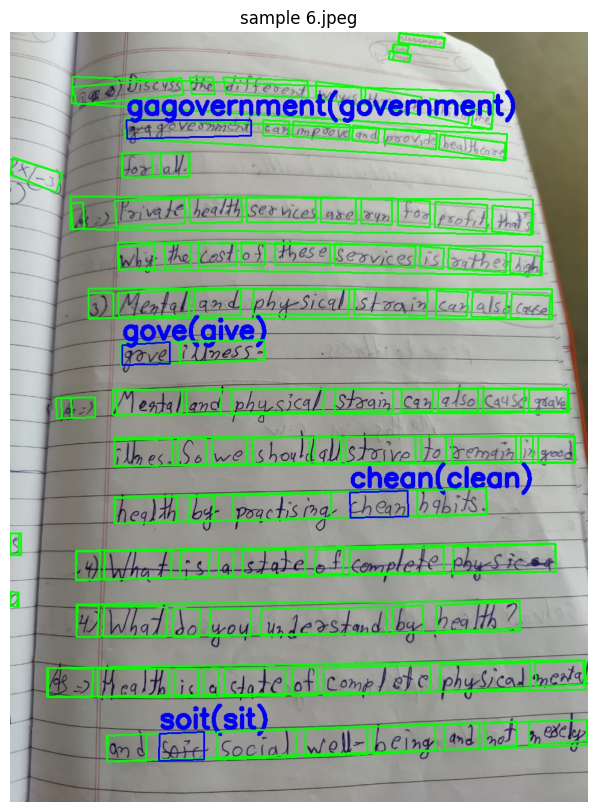

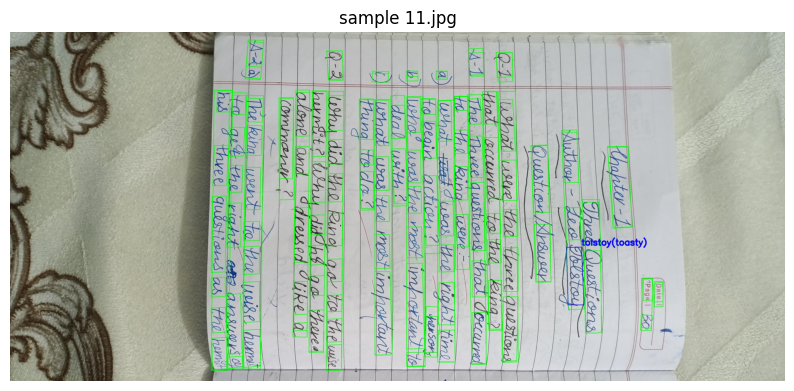

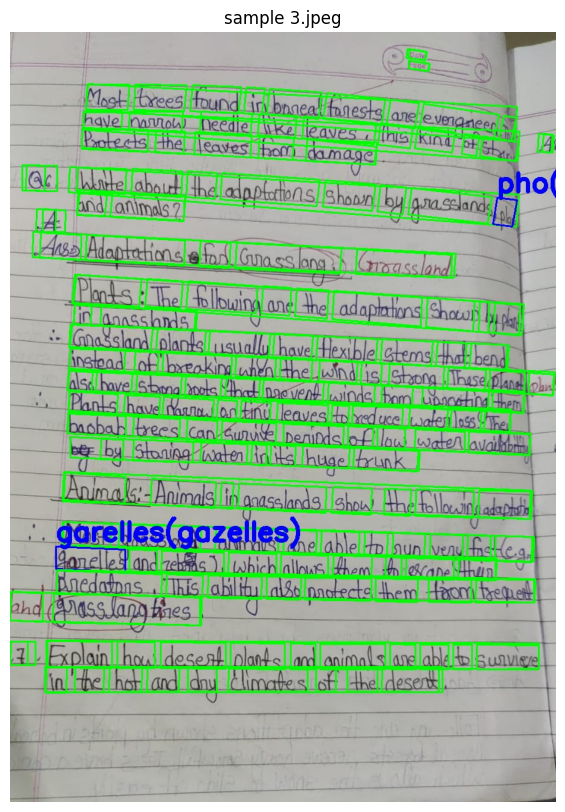

In [ ]:
plot_images_from_folder("/content/Sample_Images/Inference/Misspell_check")